In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import glob

import plotly.express as px
import plotly.io as pio

pio.renderers.default = "iframe"

from saturation.utils import *

In [3]:
n_cores = 28

spark = (SparkSession.builder
         .master(f"local[{n_cores}]")
         .appName("Saturation")
         .config("spark.sql.shuffle.partitions", "500")
         .config("spark.driver.memory", "30g")
         .config("spark.driver.maxResultSize", "8g")
         .getOrCreate())

24/08/01 14:44:25 WARN Utils: Your hostname, muninn resolves to a loopback address: 127.0.1.1; using 192.168.50.14 instead (on interface enp8s0)
24/08/01 14:44:25 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
24/08/01 14:44:26 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
24/08/01 14:44:26 WARN Utils: Service 'SparkUI' could not bind on port 4040. Attempting port 4041.


In [4]:
base_path = "/data/saturation/thesis_run_20240726"

In [5]:
configs_df = create_configs_df(read_configs(base_path, spark))
configs_pdf = configs_df.toPandas()

In [6]:
# For stats, select only fields we care about, alias them
sample_percent = 0.25

data = spark.read.parquet(f"{base_path}/*/statistics_*.parquet")
data = data.select(
    "simulation_id",
    "ntot",
    "nobs",
    "mnnd",
    "z",
    "za",
    F.col("areal_density").alias("ad"),
    F.log10("mnnd").alias("log_mnnd"),
    F.log10("nobs").alias("log_nobs"),
    F.log10("ntot").alias("log_ntot"),
)

# Join with configs to get simulation parameters
data_joined = join_configs(data, configs_df, spark).select(
    *data.columns,
    "simulation_id",
    F.col("slope").alias("b"),
    "mrp",
    "erat",
    "rmult",
)

# Rename some parameters
data = data_joined.sample(sample_percent).sort(F.rand()).cache()

In [7]:
configs_dict = dict()
for config_file in glob.glob(f"{base_path}/config/config_*.yaml"):
    for run_config in read_config(Path(config_file))["run_configurations"]:
        configs_dict.update(run_config)

In [8]:
min_b = round(data.select(F.min("b")).collect()[0][0], 2)
max_b = round(data.select(F.max("b")).collect()[0][0], 2)
min_b, max_b

24/08/01 14:47:04 WARN MemoryStore: Not enough space to cache rdd_32_490 in memory! (computed 18.9 MiB so far)
24/08/01 14:47:04 WARN BlockManager: Persisting block rdd_32_490 to disk instead.


(-4.0, -1.0)

## Plots of each variable by ntot

### Nobs vs ntot

In [9]:
def plot_overall(
    *,
    data: DataFrame,
    x_var: str,
    x_label: str,
    y_var: str,
    y_label: str,
    fig_name: str,
    x_axis_range: Tuple[float, float]=None,
    y_axis_range: Tuple[float, float]=None,
    n_target: int=None,
    color_by_var: str=None,
    color_by_label: str=None,
    color_bar_min: float=0.0,
    color_bar_max: float=0.0,
    min_ntot: int=100,
    title: str=None
):
    FONT_SIZE = 16
    FIGURE_SIZE = (8, 4)

    select_list = [x_var, y_var]
    if color_by_var:
        select_list.append(color_by_var)
    df_subset_spark = (
        data.where(F.col("ntot") > min_ntot)
            .select(*select_list)
    )
    if n_target:
        subset_sample_fraction = n_target / df_subset_spark.count()
        df_subset = df_subset_spark.sample(subset_sample_fraction).toPandas()
    else:
        df_subset = df_subset_spark.toPandas()
    
    fig = plt.figure(figsize=FIGURE_SIZE)
    ax = fig.add_subplot(111)

    if x_axis_range:
        ax.set_xlim(x_axis_range)

    if y_axis_range:
        ax.set_ylim(y_axis_range)

    if title:
        ax.set_title(title)
    
    ax.scatter(
        df_subset[x_var],
        df_subset[y_var],
        s=.25,
        c=df_subset[color_by_var] if color_by_var else None
    )

    if color_by_label:
        sm = plt.cm.ScalarMappable(cmap=plt.colormaps["cividis"])
        cbar = plt.colorbar(sm, ax=ax)
        cbar.set_label(label=color_by_label, size=FONT_SIZE)
        sm.set_clim(vmin=color_bar_min, vmax=color_bar_max)
    
    ax.set_xlabel(x_label, fontsize=FONT_SIZE)
    ax.set_ylabel(y_label, fontsize=FONT_SIZE)

    plt.savefig(f"figures/{fig_name}.png")
    plt.show()

    return ax, fig

In [10]:
data.limit(10).toPandas()

,simulation_id,ntot,nobs,mnnd,z,za,ad,log_mnnd,log_nobs,log_ntot,simulation_id,b,mrp,erat,rmult
0,4571,244747,16191,8.526606,20.681075,276.702314,0.742166,0.930776,4.209274,5.388717,4571,-2.580362,0.261841,5.590289,1.158072
1,5398,24618,3621,18.166440,10.724544,21.014674,0.145464,1.259270,3.558829,4.391253,5398,-2.874597,0.330973,12.115847,1.492801
2,7801,12879,3851,17.448166,9.826409,19.203878,0.131359,1.241750,3.585574,4.109882,7801,-3.005753,0.291072,8.504825,1.633170
3,2859,8934,1905,23.025615,0.416076,18.744914,0.326397,1.362211,3.279895,3.951046,2859,-1.458952,0.450026,9.932578,1.441395
4,1124,170,133,83.010373,-0.941581,-0.917925,0.002236,1.919132,2.123852,2.230449,1124,-3.693129,0.737269,13.964169,1.529666
5,3155,95080,6900,13.433592,18.414342,65.977748,0.378263,1.128192,3.838849,4.978089,3155,-2.703346,0.449676,6.095276,1.368863
6,8983,2950,1758,24.733783,2.971916,5.133800,0.050020,1.393291,3.245019,3.469822,8983,-2.966738,0.588199,12.997275,1.304576
7,688,30811,3450,16.752534,-1.799164,74.389632,0.649485,1.224081,3.537819,4.488706,688,-1.531099,0.521034,10.994328,1.123605
8,4087,18374,3962,16.690824,6.092411,36.655482,0.351297,1.222478,3.597914,4.264204,4087,-1.835257,0.356737,14.463823,1.629260
9,2417,14913,3876,17.845961,13.225846,39.305638,0.302167,1.251540,3.588384,4.173565,2417,-1.827233,0.722021,13.876850,1.320935


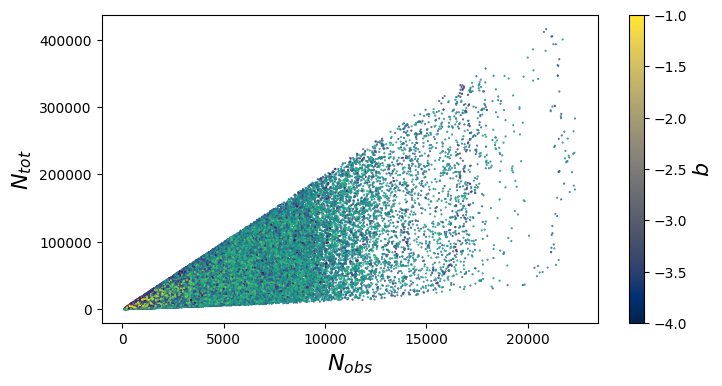

In [11]:
_ = plot_overall(
    data=data,
    n_target=50000,
    x_var="nobs",
    x_label="$N_{obs}$",
    y_var="ntot",
    y_label="$N_{tot}$",
    fig_name="nobs_by_ntot_overall",
    color_by_var="b",
    color_by_label="$b$",
    color_bar_min=min_b,
    color_bar_max=max_b
)

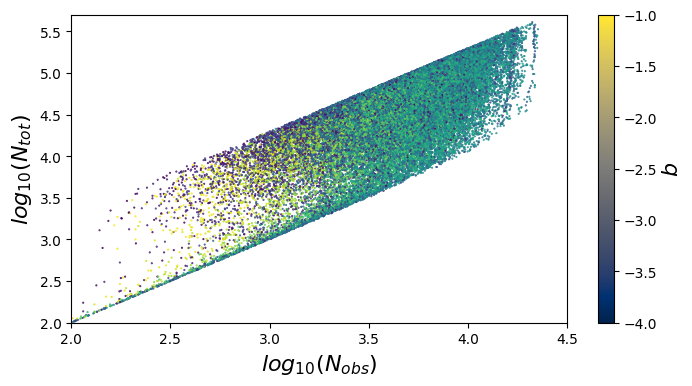

In [13]:
_ = plot_overall(
    data=data,
    n_target=50000,
    x_var="log_nobs",
    x_label="$log_{10}(N_{obs})$",
    x_axis_range=(2.0, 4.5),
    y_var="log_ntot",
    y_label="$log_{10}(N_{tot})$",
    y_axis_range=(2.0, 5.7),
    fig_name="log_nobs_by_log_ntot_overall",
    color_by_var="b",
    color_by_label="$b$",
    color_bar_min=min_b,
    color_bar_max=max_b
)

(-4.0, -3.8)


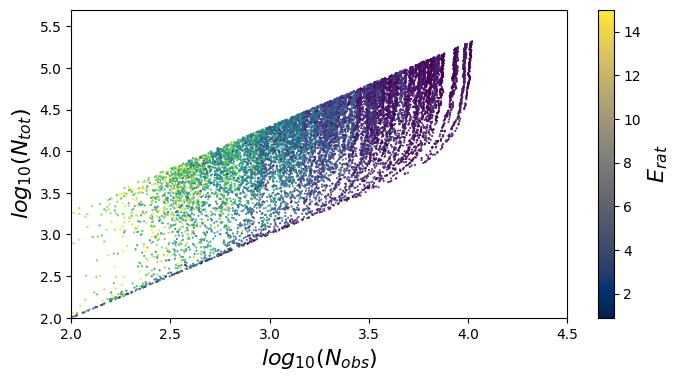

(-3.8, -3.6)


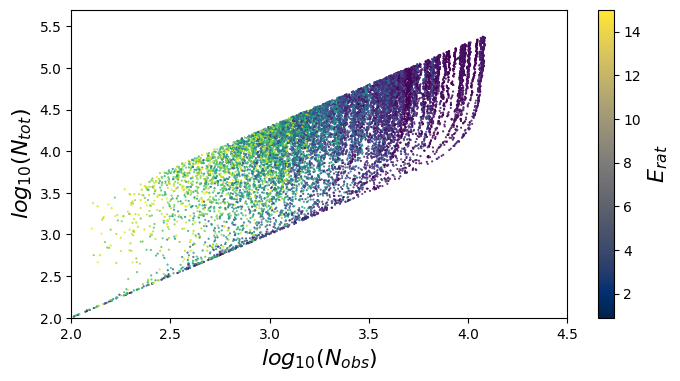

(-3.6, -3.4)


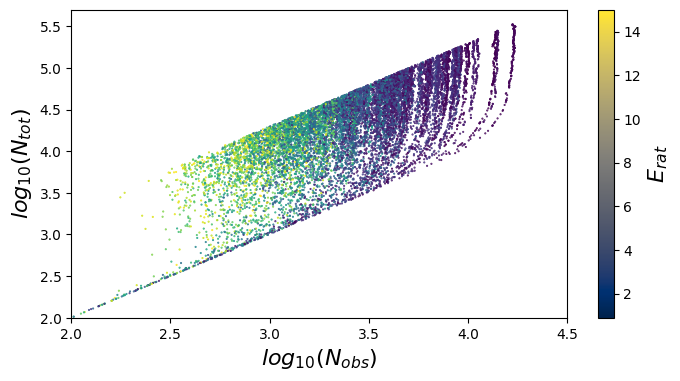

(-3.4, -3.2)


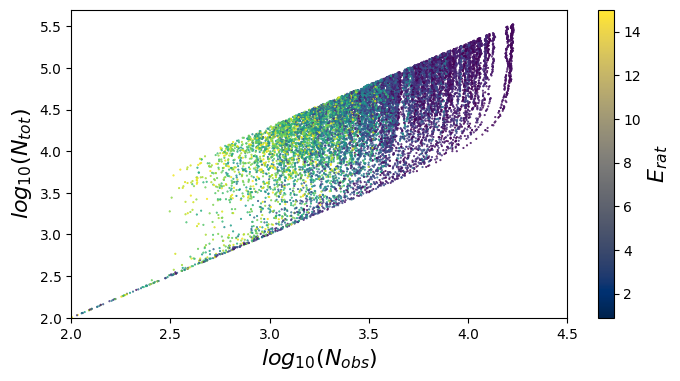

(-3.2, -3.0)


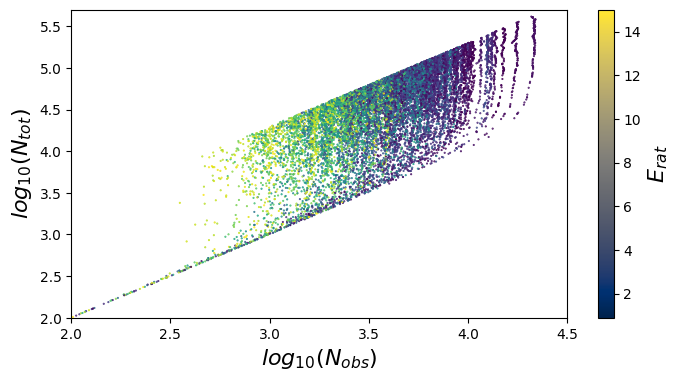

(-3.0, -2.8)


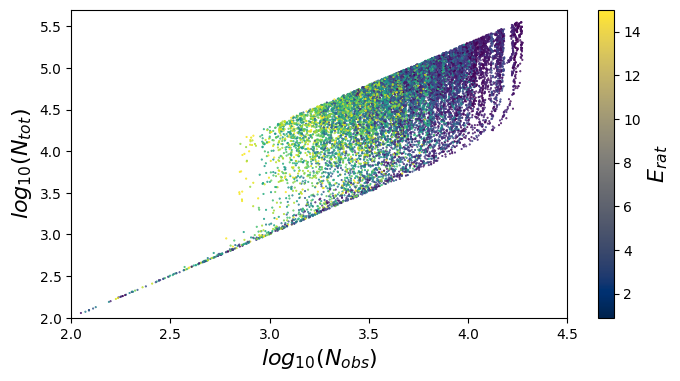

(-2.8, -2.5999999999999996)


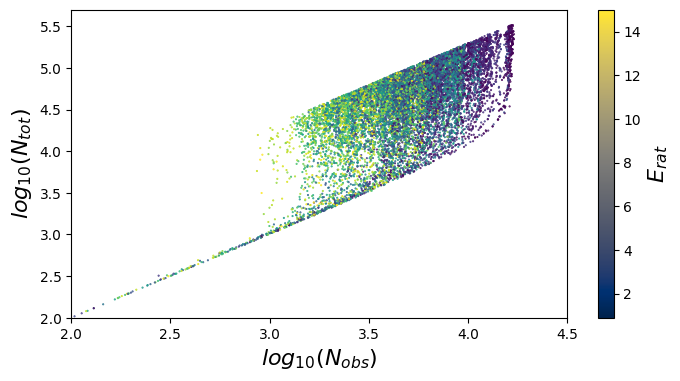

(-2.5999999999999996, -2.4)


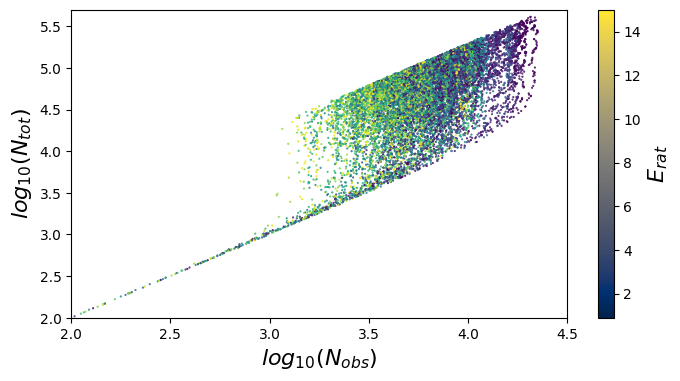

(-2.4, -2.2)


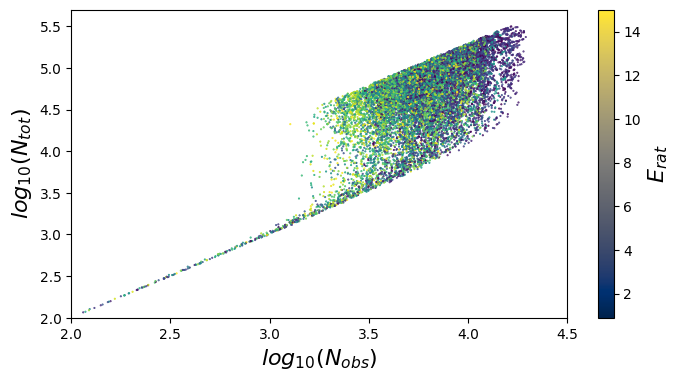

(-2.2, -2.0)


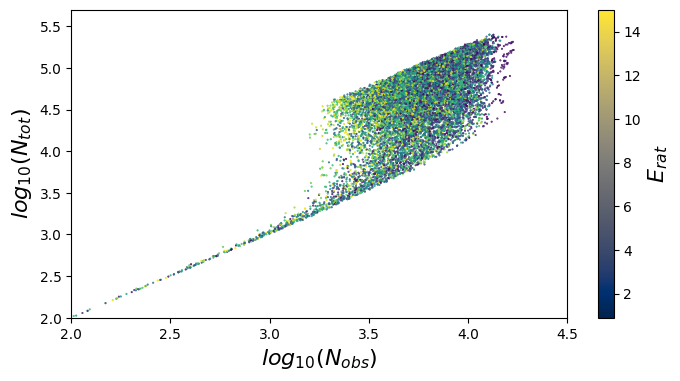

(-2.0, -1.7999999999999998)


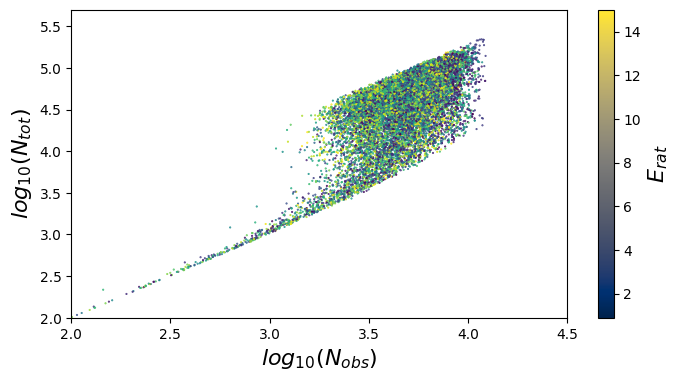

(-1.7999999999999998, -1.5999999999999996)


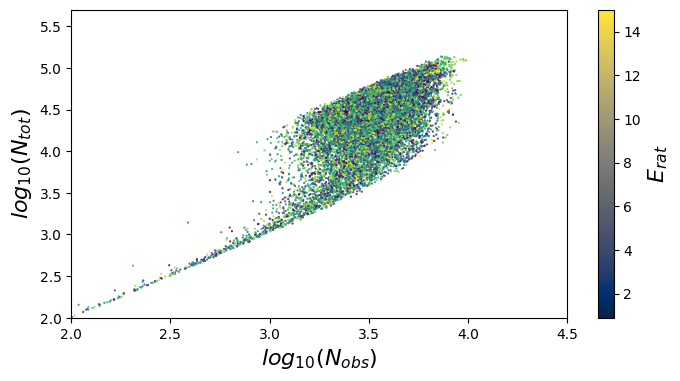

(-1.5999999999999996, -1.4)


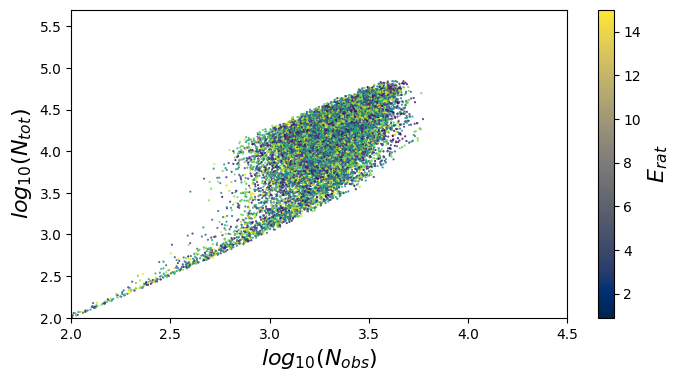

(-1.4, -1.1999999999999997)


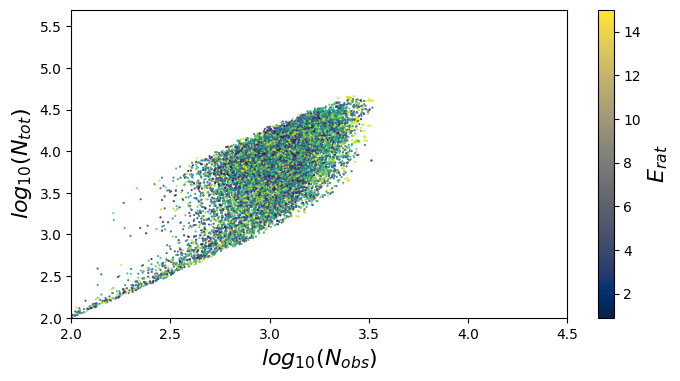

(-1.1999999999999997, -1.0)


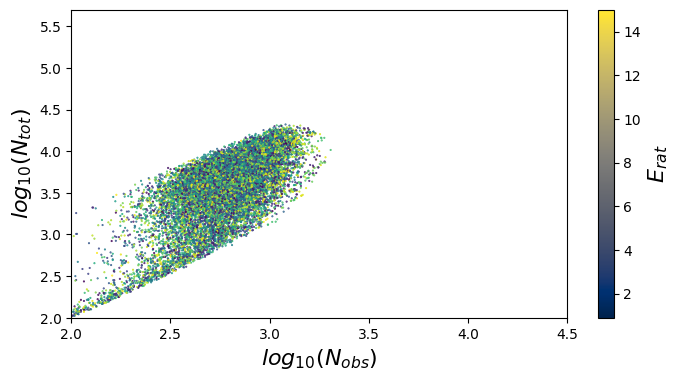

In [16]:
steps = 15
b_delta = (max_b - min_b) / steps
b_ranges = [
    (min_b + x * b_delta, min_b + (x + 1) * b_delta)
    for x in range(steps)
]

for low, high in b_ranges:
    print((low, high))
    _ = plot_overall(
        data=data.where(F.col("b").between(low, high)),
        n_target=15000,
        x_var="log_nobs",
        x_label="$log_{10}(N_{obs})$",
        x_axis_range=(2.0, 4.5),
        y_var="log_ntot",
        y_label="$log_{10}(N_{tot})$",
        y_axis_range=(2.0, 5.7),
        fig_name=f"log_nobs_by_log_ntot_b_{low:.1f}_{high:.1f}",
        color_by_var="erat",
        color_by_label="$E_{rat}$",
        color_bar_min=3.0,
        color_bar_max=15.0,
    )

### Nobs vs mnnd

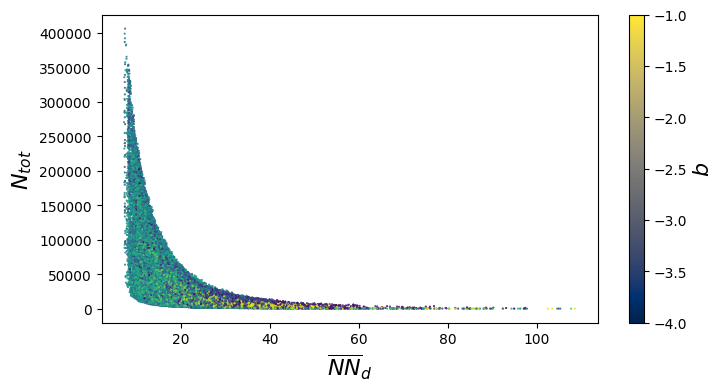

In [19]:
_ = plot_overall(
    data=data,
    n_target=50000,
    x_var="mnnd",
    x_label="$\\overline{NN}_d$",
    y_var="ntot",
    y_label="$N_{tot}$",
    fig_name="mnnd_by_ntot_overall",
    color_by_var="b",
    color_by_label="$b$",
    color_bar_min=min_b,
    color_bar_max=max_b
)

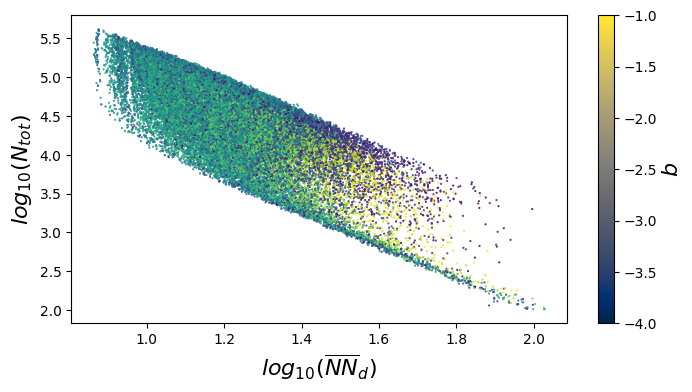

In [20]:
_ = plot_overall(
    data=data,
    n_target=50000,
    x_var="log_mnnd",
    x_label="$log_{10}(\\overline{NN}_d)$",
    y_var="log_ntot",
    y_label="$log_{10}(N_{tot})$",
    fig_name="log_mnnd_by_log_ntot_overall",
    color_by_var="b",
    color_by_label="$b$",
    color_bar_min=min_b,
    color_bar_max=max_b
)

(-4.0, -3.8)


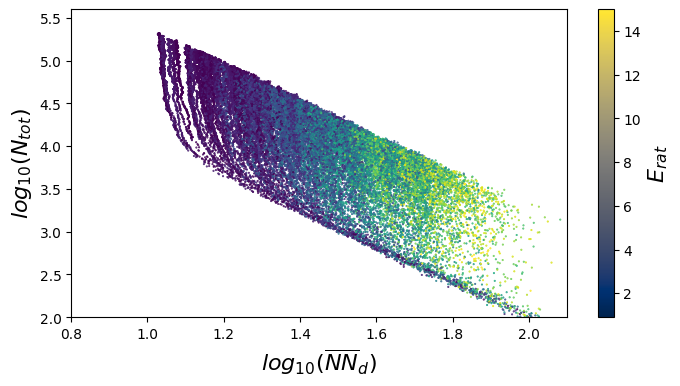

(-3.8, -3.6)


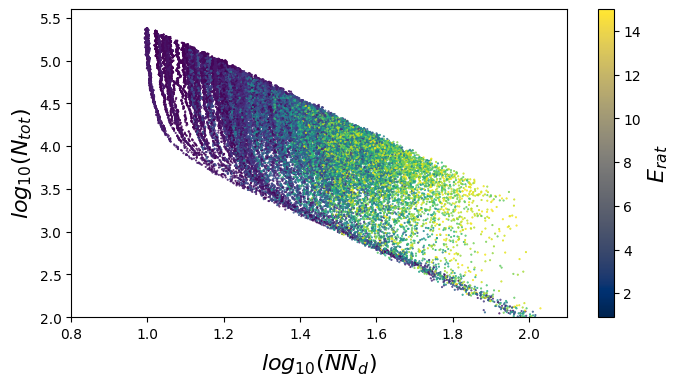

(-3.6, -3.4)


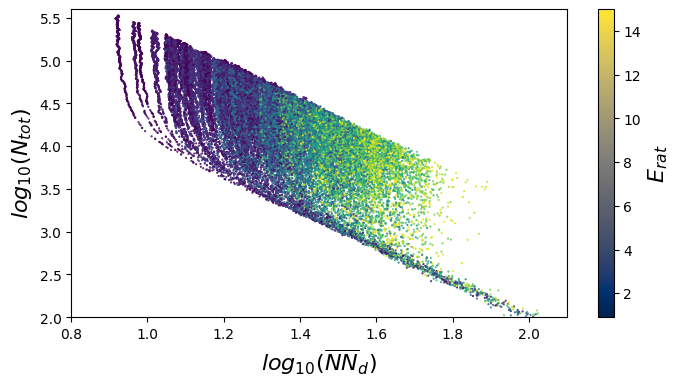

(-3.4, -3.2)


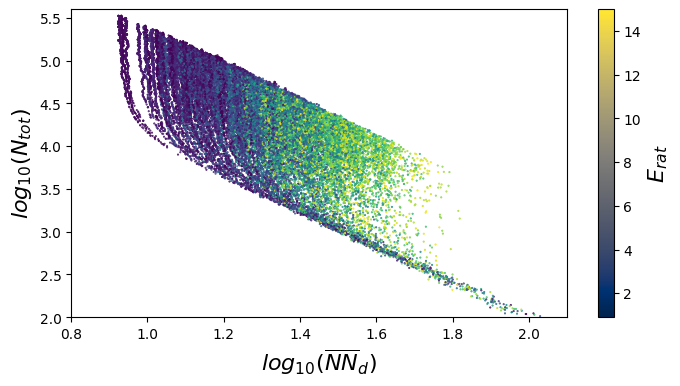

(-3.2, -3.0)


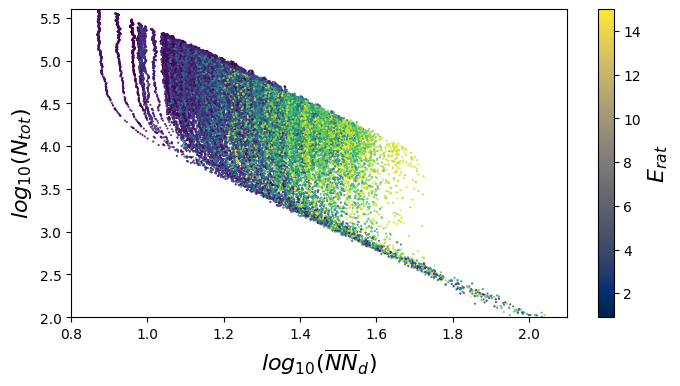

(-3.0, -2.8)


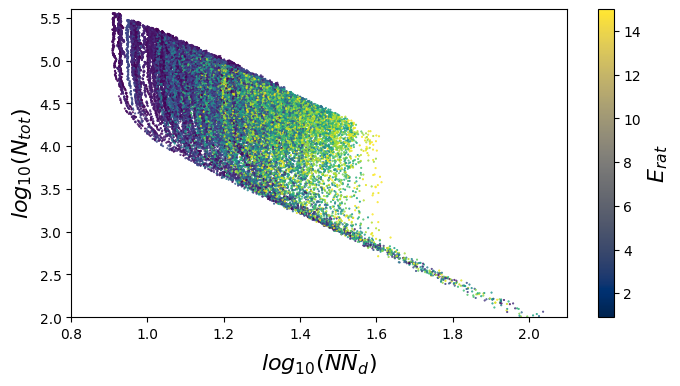

(-2.8, -2.5999999999999996)


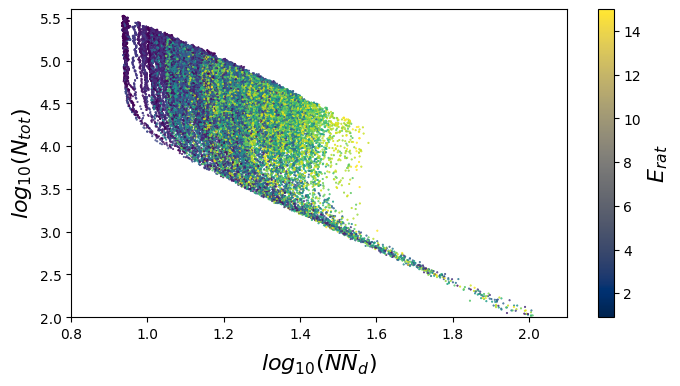

(-2.5999999999999996, -2.4)


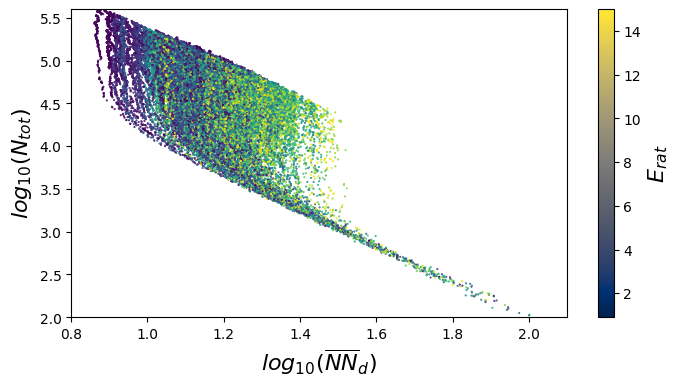

(-2.4, -2.2)


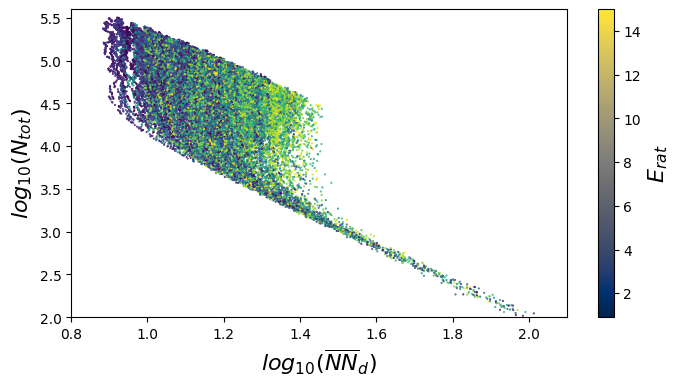

(-2.2, -2.0)


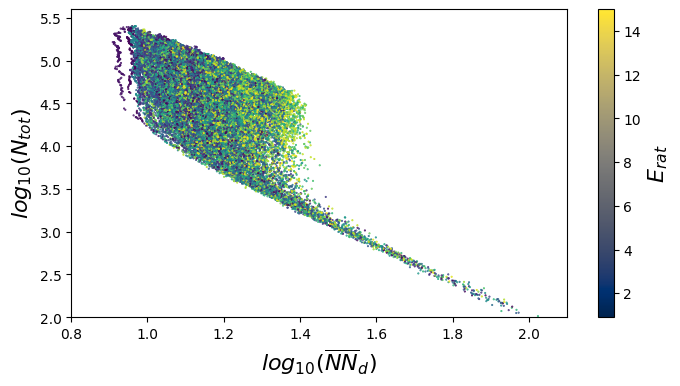

(-2.0, -1.7999999999999998)


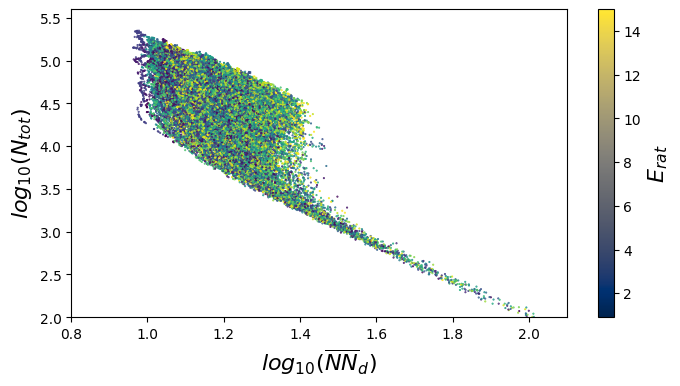

(-1.7999999999999998, -1.5999999999999996)


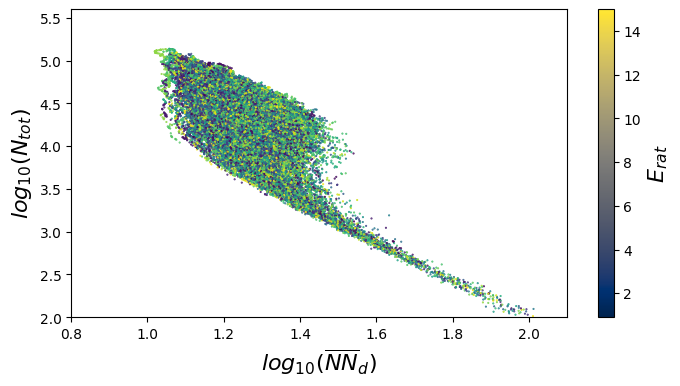

(-1.5999999999999996, -1.4)


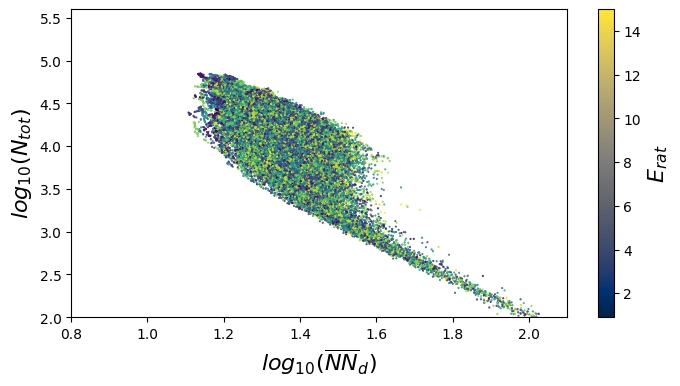

(-1.4, -1.1999999999999997)


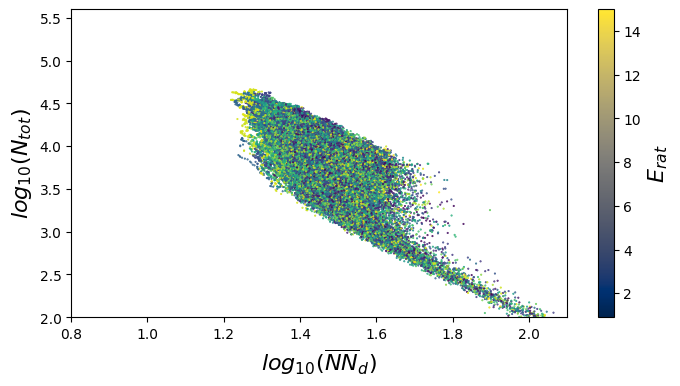

(-1.1999999999999997, -1.0)


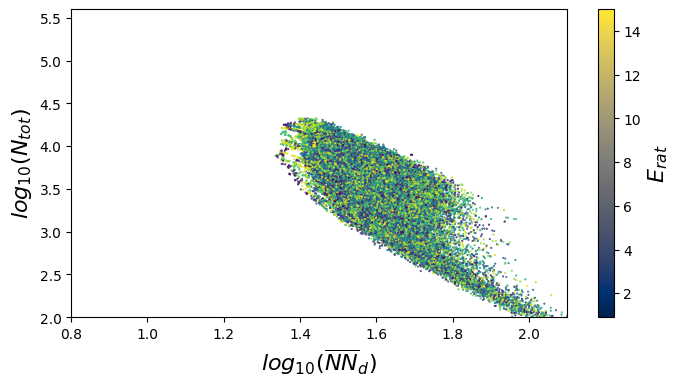

In [25]:
steps = 15
b_delta = (max_b - min_b) / steps
b_ranges = [
    (min_b + x * b_delta, min_b + (x + 1) * b_delta)
    for x in range(steps)
]

for low, high in b_ranges:
    print((low, high))
    _ = plot_overall(
        data=data.where(F.col("b").between(low, high)),
        n_target=50000,
        x_var="log_mnnd",
        x_label="$log_{10}(\\overline{NN}_d)$",
        x_axis_range=(0.8, 2.1),
        y_var="log_ntot",
        y_label="$log_{10}(N_{tot})$",
        y_axis_range=(2.0, 5.6),
        fig_name=f"log_mnnd_by_log_ntot_b_{low:.1f}_{high:.1f}",
        color_by_var="erat",
        color_by_label="$E_{rat}$",
        color_bar_min=3.0,
        color_bar_max=15.0,
    )

### Z and ZA by ntot

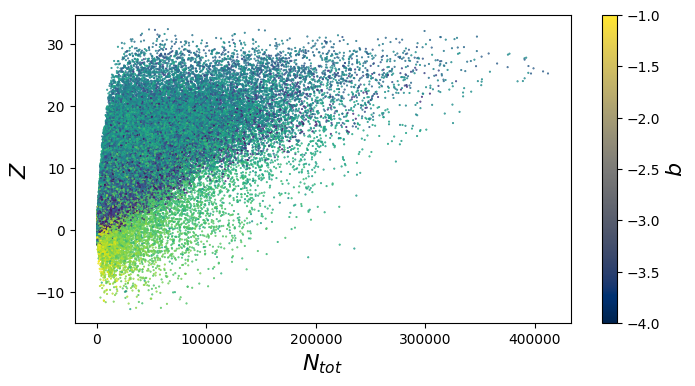

In [24]:
_ = plot_overall(
    data=data,
    n_target=50000,
    x_var="ntot",
    x_label="$N_{tot}$",
    y_var="z",
    y_label="$Z$",
    fig_name="z_by_ntot_overall",
    color_by_var="b",
    color_by_label="$b$",
    color_bar_min=min_b,
    color_bar_max=max_b
)

(-4.0, -3.8)


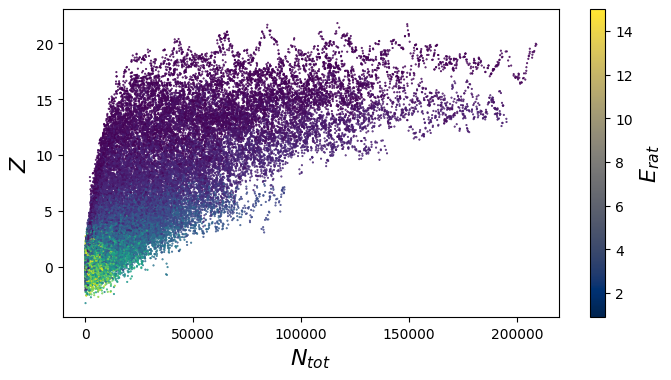

(-3.8, -3.6)


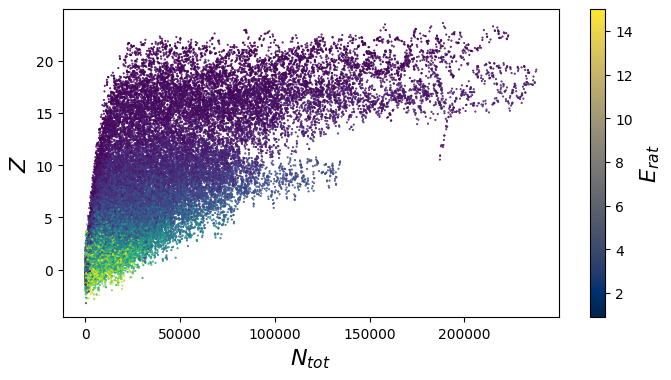

(-3.6, -3.4)


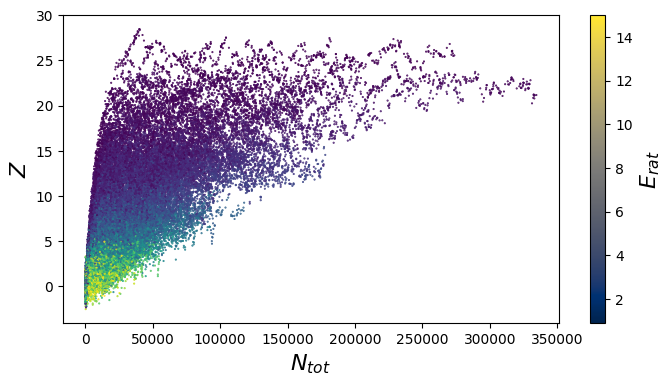

(-3.4, -3.2)


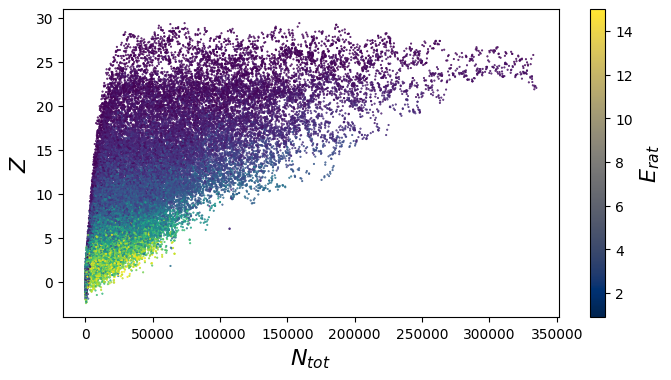

(-3.2, -3.0)


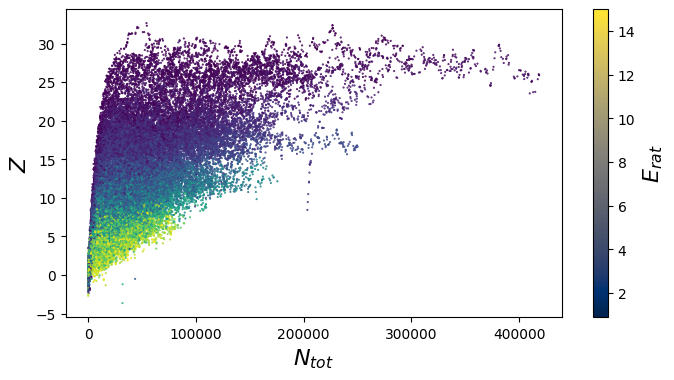

(-3.0, -2.8)


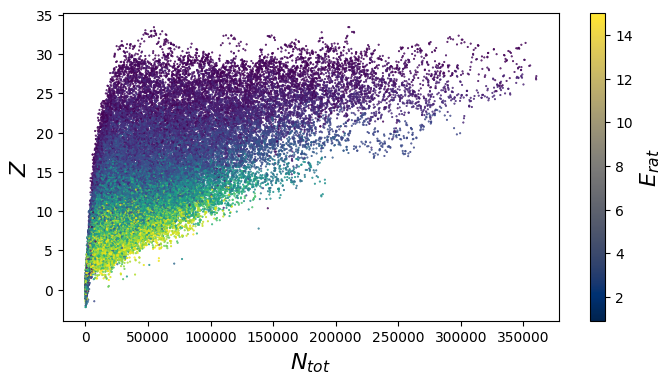

(-2.8, -2.5999999999999996)


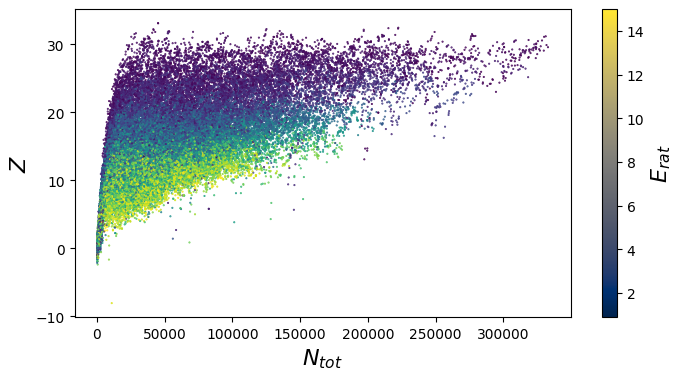

(-2.5999999999999996, -2.4)


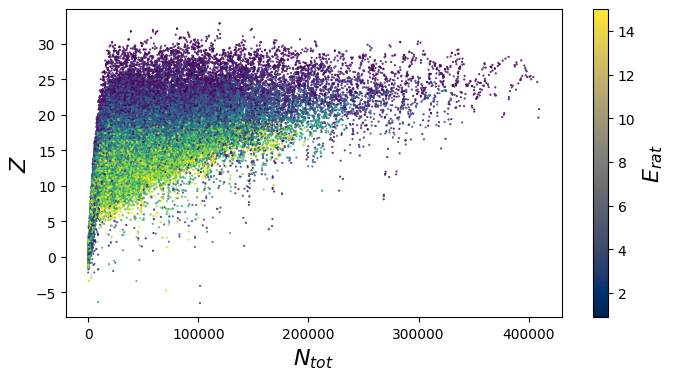

(-2.4, -2.2)


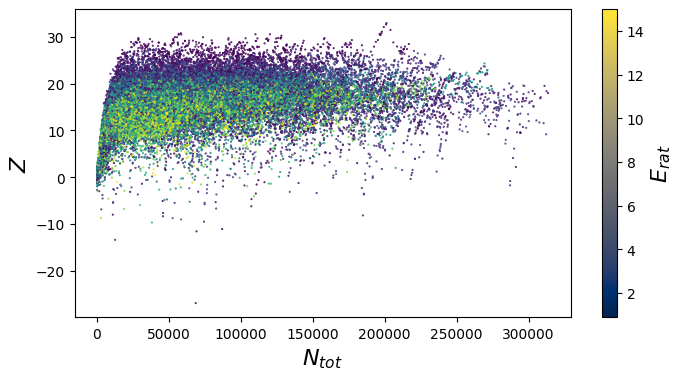

(-2.2, -2.0)


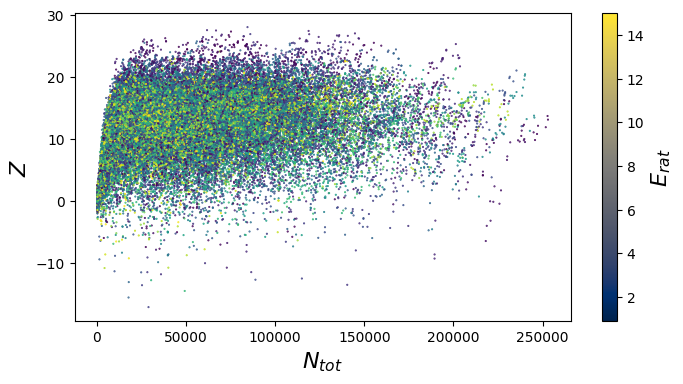

(-2.0, -1.7999999999999998)


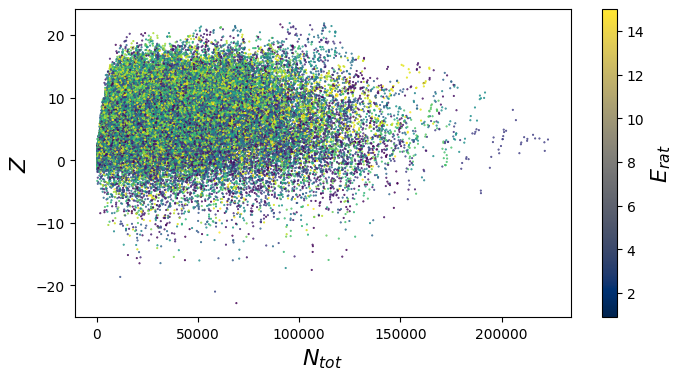

(-1.7999999999999998, -1.5999999999999996)


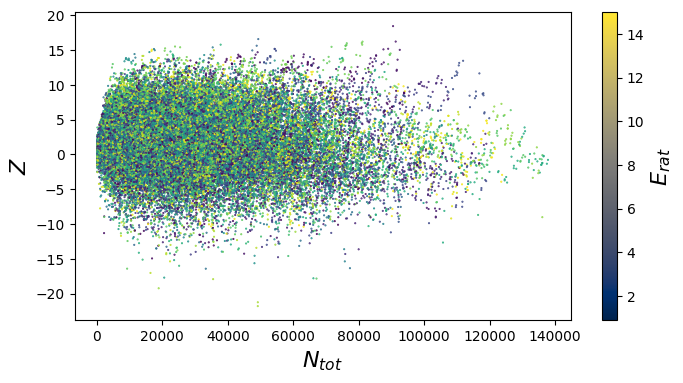

(-1.5999999999999996, -1.4)


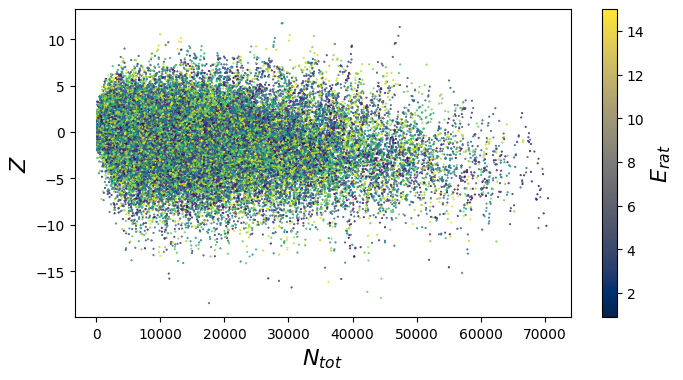

(-1.4, -1.1999999999999997)


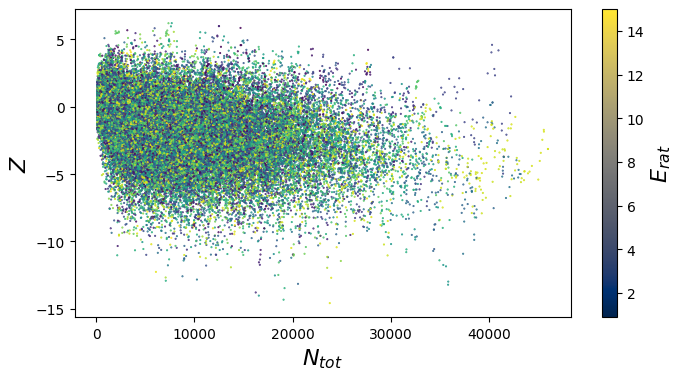

(-1.1999999999999997, -1.0)


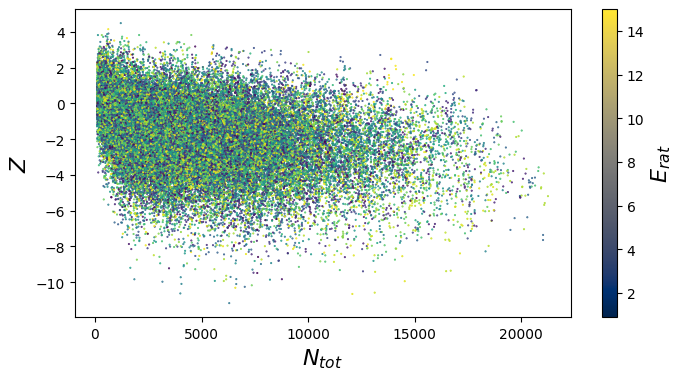

In [26]:
steps = 15
b_delta = (max_b - min_b) / steps
b_ranges = [
    (min_b + x * b_delta, min_b + (x + 1) * b_delta)
    for x in range(steps)
]

for low, high in b_ranges:
    print((low, high))
    _ = plot_overall(
        data=data.where(F.col("b").between(low, high)),
        n_target=50000,
        x_var="ntot",
        x_label="$N_{tot}$",
        # x_axis_range=(0, 200000),
        y_var="z",
        y_label="$Z$",
        # y_axis_range=(-15, 30),
        fig_name=f"z_by_ntot_b_{low:.1f}_{high:.1f}",
        # color_by_var="mrp",
        # color_by_label="$M_r$",
        # color_bar_min=0.25,
        # color_bar_max=0.75
        color_by_var="erat",
        color_by_label="$E_{rat}$",
        color_bar_min=3.0,
        color_bar_max=15.0,
    )

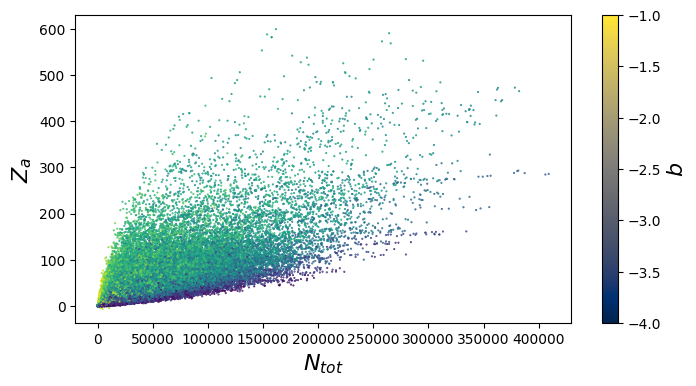

In [27]:
_ = plot_overall(
    data=data,
    n_target=50000,
    x_var="ntot",
    x_label="$N_{tot}$",
    y_var="za",
    y_label="$Z_a$",
    fig_name="za_by_ntot_overall",
    color_by_var="b",
    color_by_label="$b$",
    color_bar_min=min_b,
    color_bar_max=max_b
)

(-4.0, -3.8)


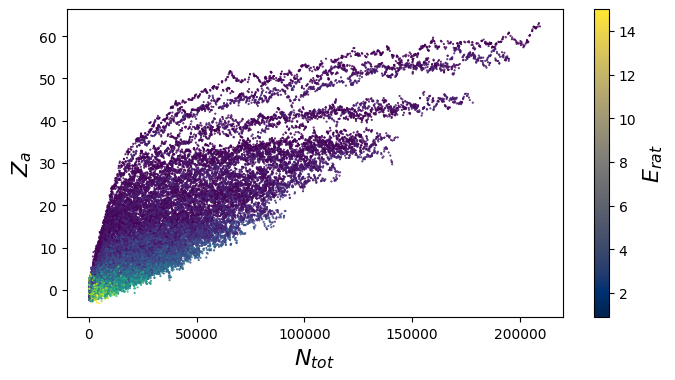

(-3.8, -3.6)


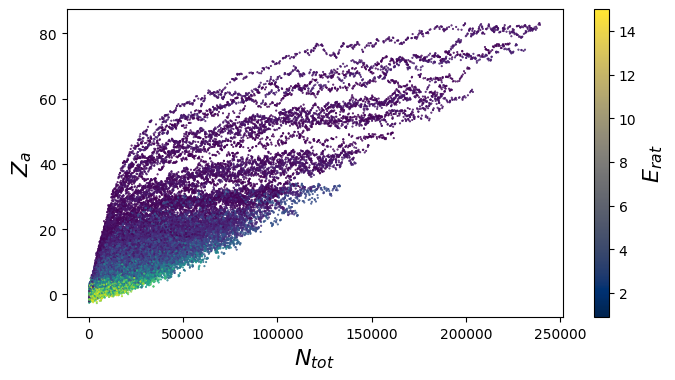

(-3.6, -3.4)


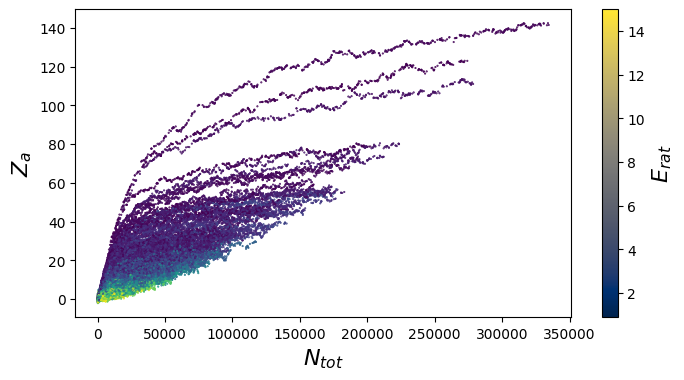

(-3.4, -3.2)


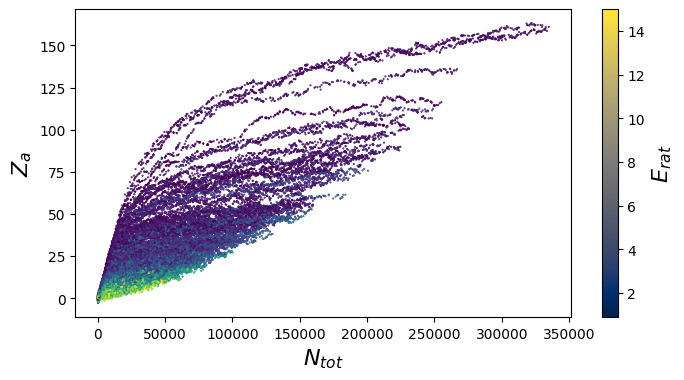

(-3.2, -3.0)


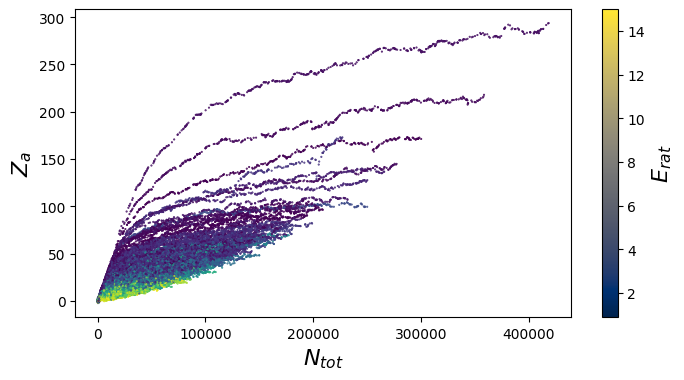

(-3.0, -2.8)


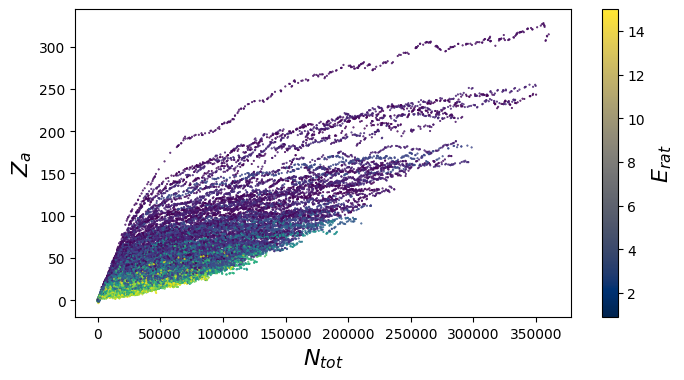

(-2.8, -2.5999999999999996)


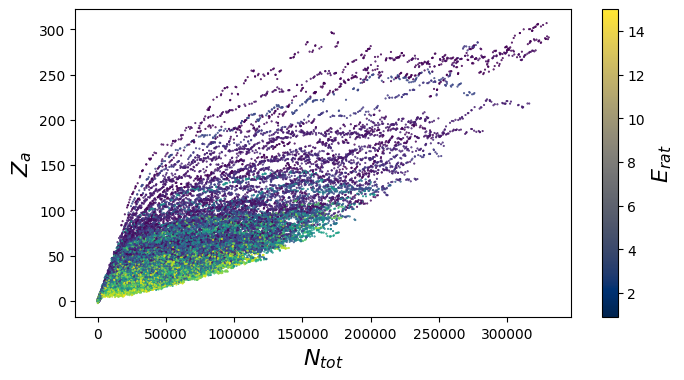

(-2.5999999999999996, -2.4)


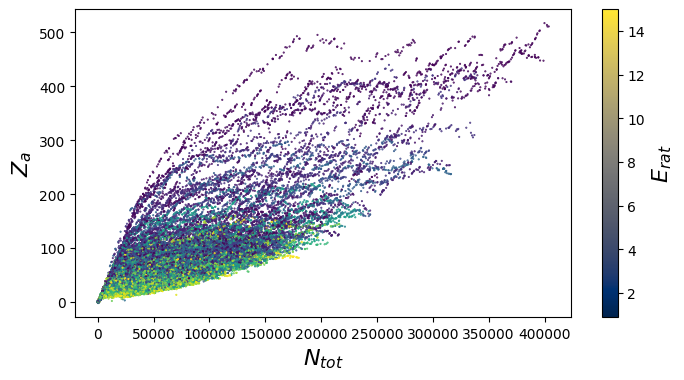

(-2.4, -2.2)


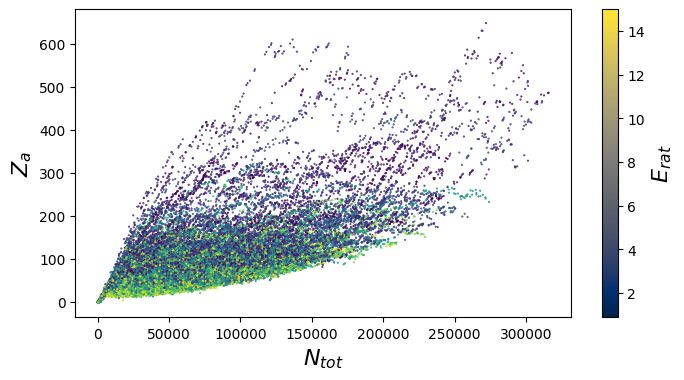

(-2.2, -2.0)


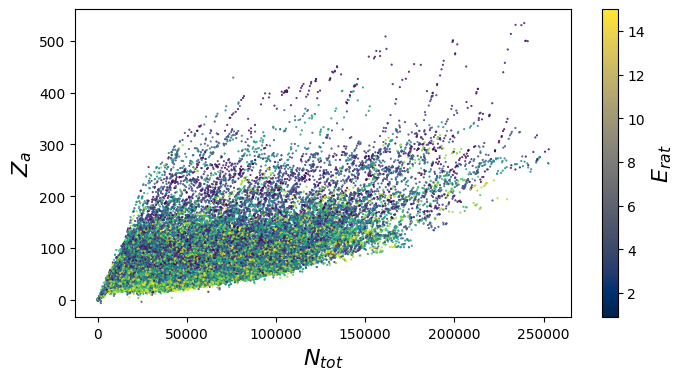

(-2.0, -1.7999999999999998)


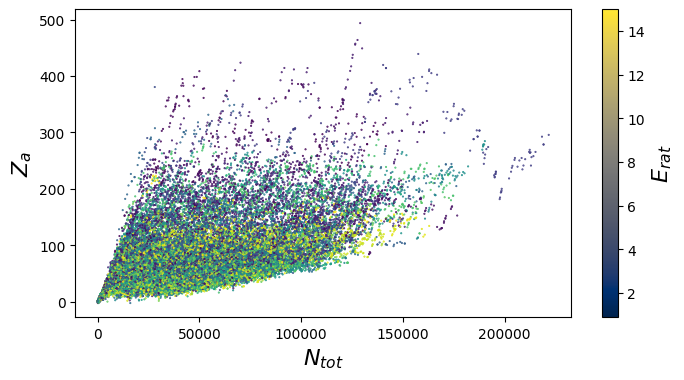

(-1.7999999999999998, -1.5999999999999996)


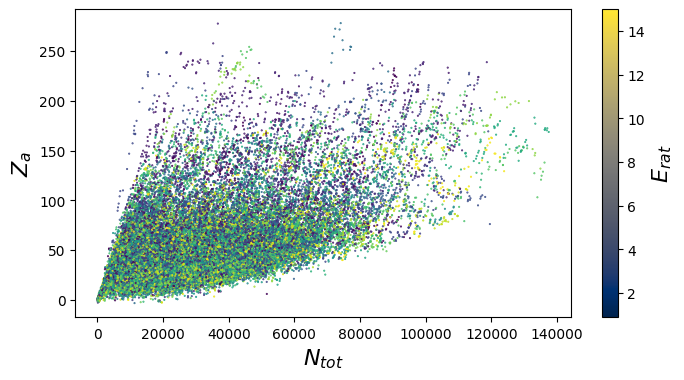

(-1.5999999999999996, -1.4)


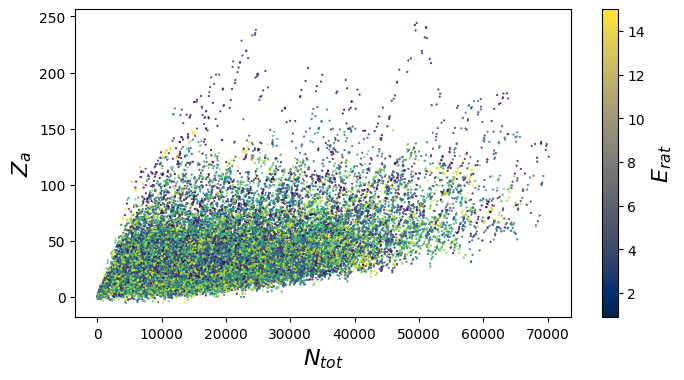

(-1.4, -1.1999999999999997)


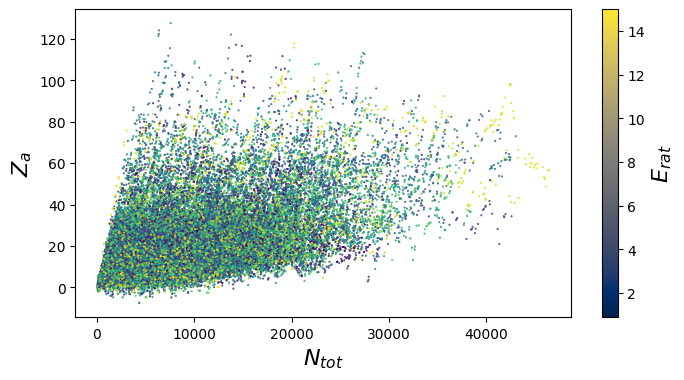

(-1.1999999999999997, -1.0)


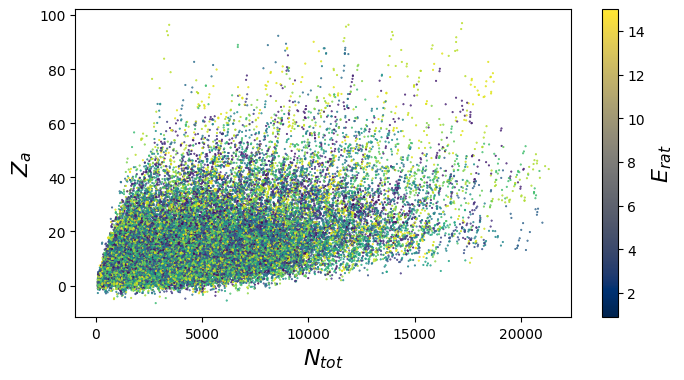

In [28]:
steps = 15
b_delta = (max_b - min_b) / steps
b_ranges = [
    (min_b + x * b_delta, min_b + (x + 1) * b_delta)
    for x in range(steps)
]

for low, high in b_ranges:
    print((low, high))
    _ = plot_overall(
        data=data.where(F.col("b").between(low, high)),
        n_target=50000,
        x_var="ntot",
        x_label="$N_{tot}$",
        # x_axis_range=(0, 200000),
        y_var="za",
        y_label="$Z_a$",
        # y_axis_range=(0, 500),
        fig_name=f"za_by_ntot_b_{low:.1f}_{high:.1f}",
        color_by_var="erat",
        color_by_label="$E_{rat}$",
        color_bar_min=3.0,
        color_bar_max=15.0,
    )

### AD by ntot

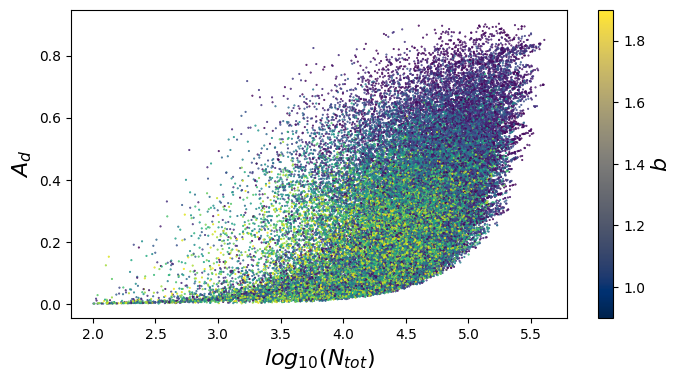

In [33]:
_ = plot_overall(
    data=data,
    n_target=50000,
    x_var="log_ntot",
    x_label="$log_{10}(N_{tot})$",
    y_var="ad",
    y_label="$A_d$",
    fig_name="ad_by_log_ntot_overall_rmult",
    color_by_var="rmult",
    color_by_label="$b$",
    color_bar_min=1.1,
    color_bar_max=1.9
)

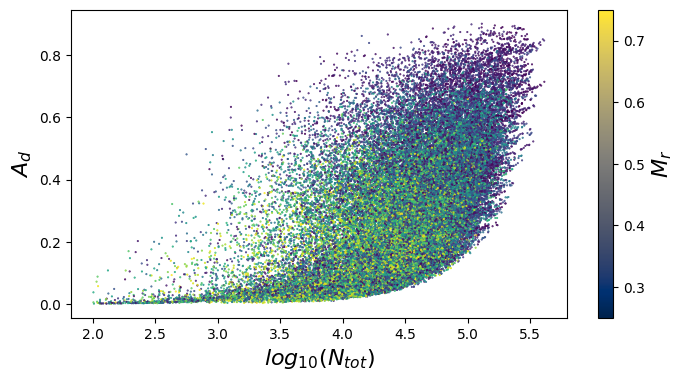

24/08/01 15:14:18 WARN JavaUtils: Attempt to delete using native Unix OS command failed for path = /tmp/blockmgr-130762d7-83d2-4c2a-b6fa-06c2cc41c272. Falling back to Java IO way
java.io.IOException: Failed to delete: /tmp/blockmgr-130762d7-83d2-4c2a-b6fa-06c2cc41c272
	at org.apache.spark.network.util.JavaUtils.deleteRecursivelyUsingUnixNative(JavaUtils.java:173)
	at org.apache.spark.network.util.JavaUtils.deleteRecursively(JavaUtils.java:109)
	at org.apache.spark.network.util.JavaUtils.deleteRecursively(JavaUtils.java:90)
	at org.apache.spark.util.SparkFileUtils.deleteRecursively(SparkFileUtils.scala:121)
	at org.apache.spark.util.SparkFileUtils.deleteRecursively$(SparkFileUtils.scala:120)
	at org.apache.spark.util.Utils$.deleteRecursively(Utils.scala:1126)
	at org.apache.spark.storage.DiskBlockManager.$anonfun$doStop$1(DiskBlockManager.scala:368)
	at org.apache.spark.storage.DiskBlockManager.$anonfun$doStop$1$adapted(DiskBlockManager.scala:364)
	at scala.collection.IndexedSeqOptimize

In [34]:
_ = plot_overall(
    data=data,
    n_target=50000,
    x_var="log_ntot",
    x_label="$log_{10}(N_{tot})$",
    y_var="ad",
    y_label="$A_d$",
    fig_name="ad_by_log_ntot_overall_mrp",
    color_by_var="mrp",
    color_by_label="$M_r$",
    color_bar_min=0.25,
    color_bar_max=0.75
)

In [ ]:
_ = plot_overall(
    data=data,
    n_target=50000,
    x_var="log_ntot",
    x_label="$log_{10}(N_{tot})$",
    y_var="ad",
    y_label="$A_d$",
    fig_name="ad_by_log_ntot_overall_mrp",
    color_by_var="mrp",
    color_by_label="$M_r$",
    color_bar_min=0.25,
    color_bar_max=0.75
)